<a href="https://colab.research.google.com/github/buivanson47/Computer-Vision/blob/master/Bai2FN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Key Point trên các vật thể **

In [ ]:
# Show Keypoint
import cv2
from google.colab.patches import cv2_imshow
def ShowKeyPoint(file):
  # Reading the image and converting into B/W
  image = cv2.imread(file)
  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
  # Applying the function
  sift = cv2.xfeatures2d.SIFT_create()
  kp, des = sift.detectAndCompute(gray_image, None)
    
  # Applying the function
  kp_image = cv2.drawKeypoints(image, kp, None, color=(
      0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  cv2_imshow(kp_image)

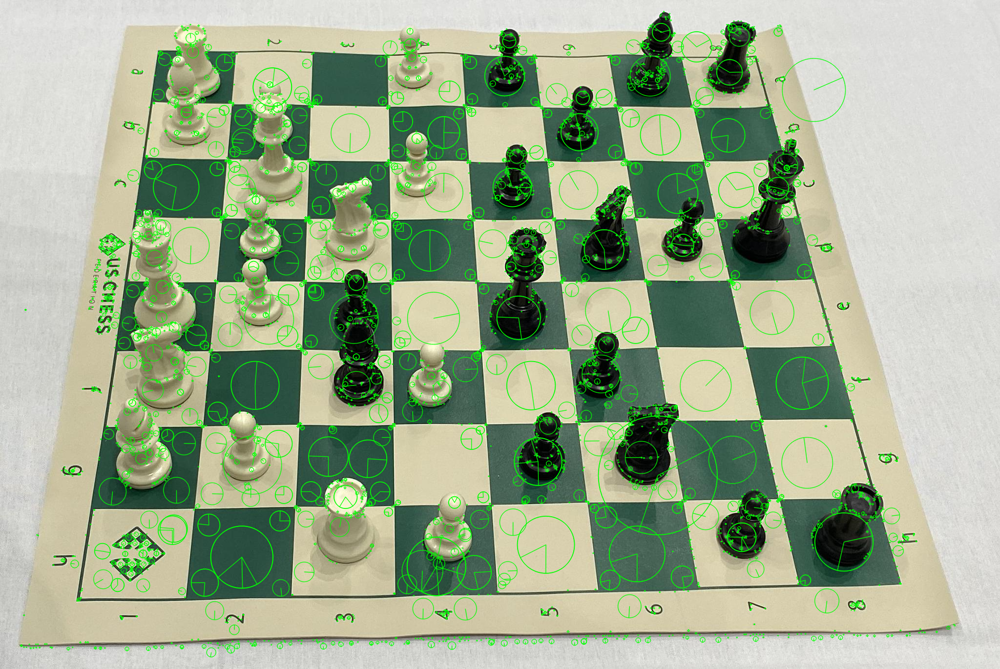

In [ ]:
ShowKeyPoint('banco.jpg')

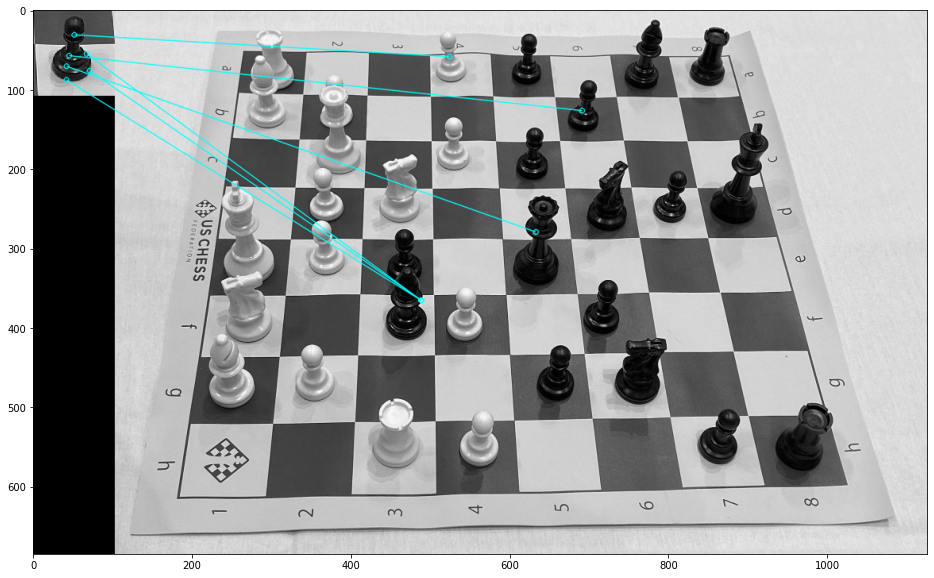

(<matplotlib.image.AxesImage at 0x7fe579c7ef90>, None)

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img1 = cv.imread('query.png',0)          # queryImage
img2 = cv.imread('banco.jpg',0) # trainImage
img2 = cv.resize(img2, (1024, 685))
# Initiate SIFT detector
sift = cv.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)


FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1,des2,k=2)
# store all the good matches as per Lowe's ratio test.
good = []
for m,n in matches:
    if m.distance < n.distance:
        good.append(m)

if len(good)>10:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC,5.0)
    matchesMask = mask.ravel().tolist()
    h,w = img1.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv.perspectiveTransform(pts,M)
    img2 = cv.polylines(img2,[np.int32(dst)],True,255,3, cv.LINE_AA)
else:
    print("Not enough matches are found - {}/{}".format(len(good), 10) )
    matchesMask = None

draw_params = dict(matchColor = (0,255,255), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
img3 = cv.drawMatches(img1,kp1,img2,kp2,good,None,**draw_params)
plt.figure(figsize=(20,10))
plt.imshow(img3, 'gray'),plt.show()

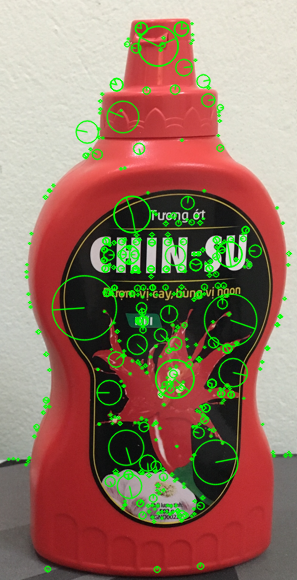

In [ ]:
ShowKeyPoint('chinsu.png')

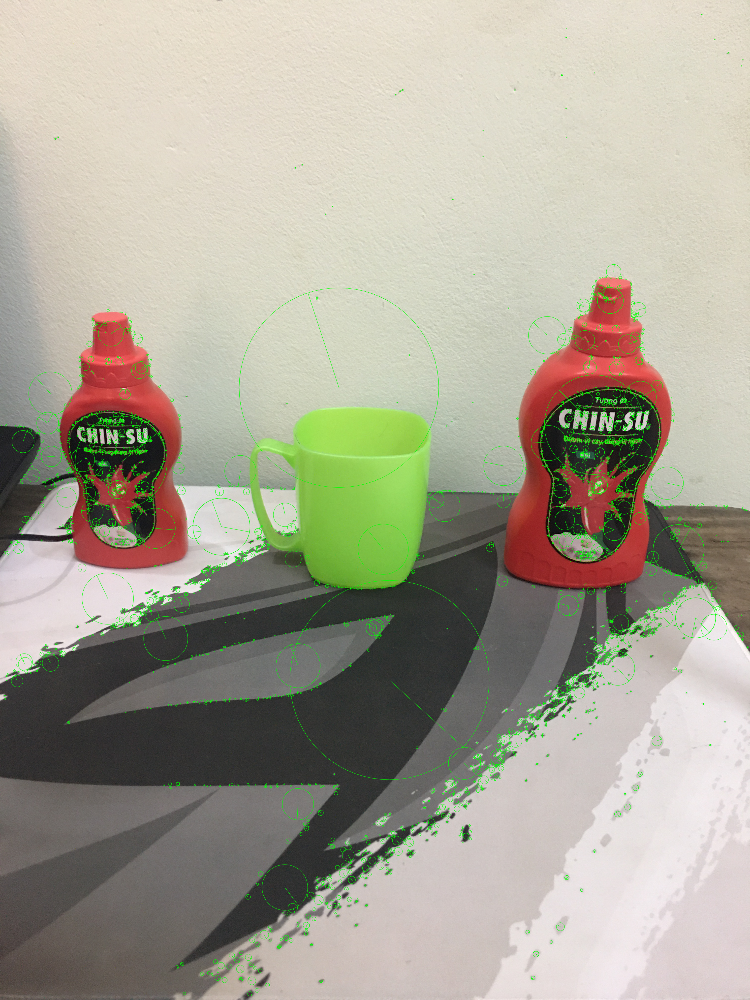

In [ ]:
ShowKeyPoint('IMG_2280.JPG')

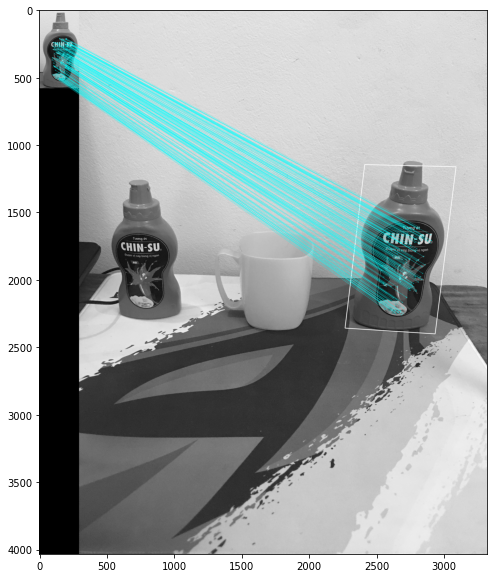

(<matplotlib.image.AxesImage at 0x7fe579b96e10>, None)

In [ ]:
img1 = cv.imread('chinsu.png',0)          # queryImage
img2 = cv.imread('IMG_2280.JPG',0) # trainImage
# Initiate SIFT detector
sift = cv.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)


FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1,des2,k=2)
# store all the good matches as per Lowe's ratio test.
good = []
for m,n in matches:
    if m.distance < n.distance:
        good.append(m)

if len(good)>10:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC,5.0)
    matchesMask = mask.ravel().tolist()
    h,w = img1.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv.perspectiveTransform(pts,M)
    img2 = cv.polylines(img2,[np.int32(dst)],True,255,3, cv.LINE_AA)
else:
    print("Not enough matches are found - {}/{}".format(len(good), 10) )
    matchesMask = None

draw_params = dict(matchColor = (0,255,255), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
img3 = cv.drawMatches(img1,kp1,img2,kp2,good,None,**draw_params)
plt.figure(figsize=(20,10))
plt.imshow(img3, 'gray'),plt.show()

## **So khớp ảnh theo khung hình**

In [ ]:
def matching(img1,img2,nkeypoint,detectSift):
  if detectSift == True:sift = cv.SIFT_create()
  else :sift = cv.ORB_create()
  # find the keypoints and descriptors with SIFT
  kp1, des1 = sift.detectAndCompute(img1,None)
  kp2, des2 = sift.detectAndCompute(img2,None)
  FLANN_INDEX_KDTREE = 1
  index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
  search_params = dict(checks = 50)
  # flann = cv.FlannBasedMatcher(index_params, search_params)
  flann=cv.BFMatcher()
  matches = flann.knnMatch(des1,des2,k=2)
  # store all the good matches as per Lowe's ratio test.
  good = []
  for m,n in matches:
      if m.distance < 0.7*n.distance:
          good.append(m)
  # print(len(good))
  nkeypoint.append(len(good))
  if len(good)>10:
      
      src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
      dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
      M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC,5.0)
      matchesMask = mask.ravel().tolist()
      h,w = img1.shape[0:2]
      pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
      dst = cv.perspectiveTransform(pts,M)
      img2 = cv.polylines(img2,[np.int32(dst)],True,255,3, cv.LINE_AA)
  else:
      # print("Not enough matches are found - {}/{}".format(len(good), 10) )
      matchesMask = None

  draw_params = dict(matchColor = (0,255,255), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
def matchingInVideo(cap,img,nkeypoint,detectSift):
    while(cap.isOpened()):
      ret, frame = cap.read()
      if ret == False:
          break
      matching(img,frame,nkeypoint,detectSift)
      # if i%10==0:cv2_imshow(frame) 
      # i+=1


*Giữ vị trí ổn định*

31.919215202331543s


Text(0, 0.5, 'acurracy')

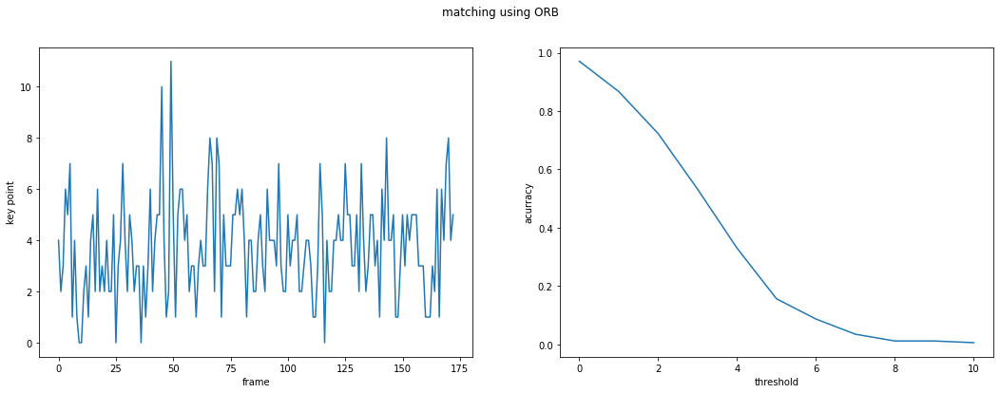

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import time
import cv2 as cv
from matplotlib import pyplot as plt
begin=time.time()
cap= cv.VideoCapture('IMG_2297.mp4')
img = cv.imread('chinsu.png') 
nkeypoint=[]
matchingInVideo(cap,img,nkeypoint,False)
print(str(time.time()-begin)+'s')
acurracy=[]
count=0
for i in range(max(nkeypoint)):
  count=0
  for j in nkeypoint:
    if j>i: count+=1
  acurracy.append(count/len(nkeypoint))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('matching using ORB')
ax1.plot(nkeypoint)
ax1.set_xlabel('frame')
ax1.set_ylabel('key point')
ax2.plot(acurracy)
ax2.set_xlabel('threshold')
ax2.set_ylabel('acurracy')

357.58295917510986s


Text(0, 0.5, 'acurracy')

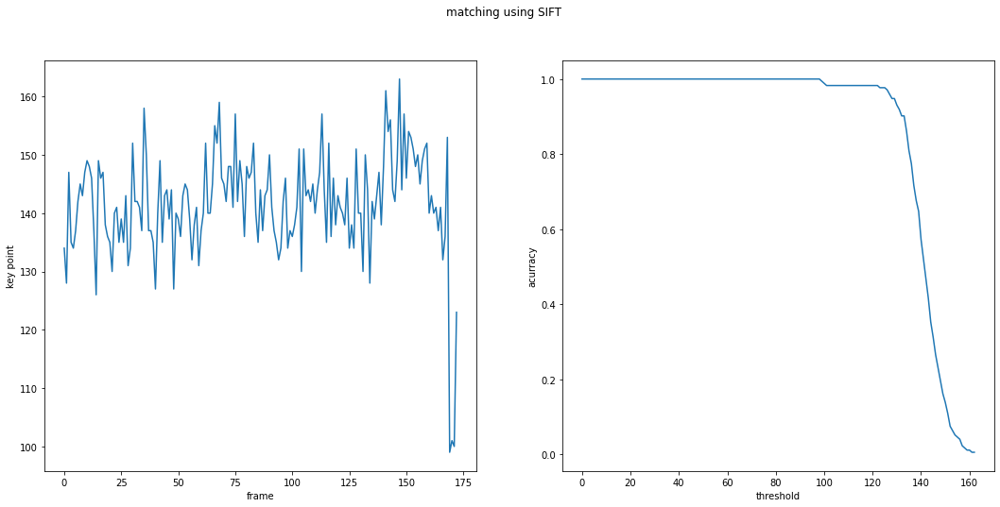

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import time
import cv2 as cv
from matplotlib import pyplot as plt
begin=time.time()
cap= cv.VideoCapture('IMG_2297.mp4')
img = cv.imread('chinsu.png') 
nkeypoint=[]
matchingInVideo(cap,img,nkeypoint,True)
print(str(time.time()-begin)+'s')
acurracy=[]
count=0
for i in range(max(nkeypoint)):
  count=0
  for j in nkeypoint:
    if j>i: count+=1
  acurracy.append(count/len(nkeypoint))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
fig.suptitle('matching using SIFT')
ax1.plot(nkeypoint)
ax1.set_xlabel('frame')
ax1.set_ylabel('key point')
ax2.plot(acurracy)
ax2.set_xlabel('threshold')
ax2.set_ylabel('acurracy')

# *Xoay khung hình*

57.992573976516724s


Text(0, 0.5, 'acurracy')

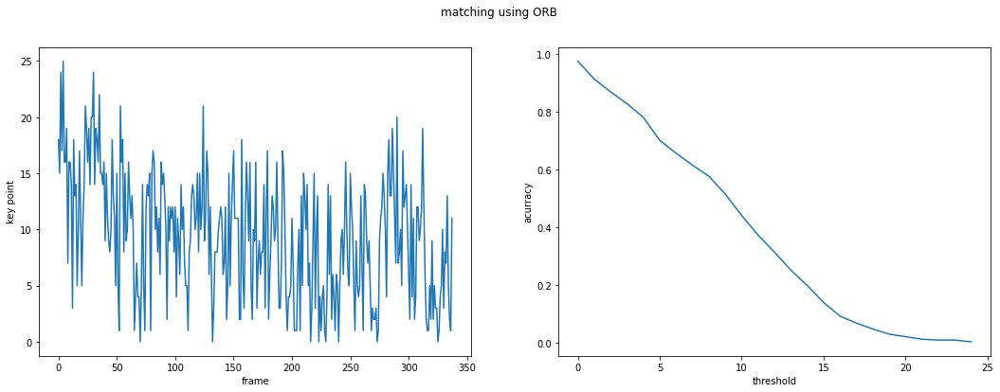

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import time
import cv2 as cv
from matplotlib import pyplot as plt
begin=time.time()
cap= cv.VideoCapture('IMG_2276.mp4')
img = cv.imread('chinsu.png') 
nkeypoint=[]
matchingInVideo(cap,img,nkeypoint,False)
print(str(time.time()-begin)+'s')
acurracy=[]
count=0
for i in range(max(nkeypoint)):
  count=0
  for j in nkeypoint:
    if j>i: count+=1
  acurracy.append(count/len(nkeypoint))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('matching using ORB')
ax1.plot(nkeypoint)
ax1.set_xlabel('frame')
ax1.set_ylabel('key point')
ax2.plot(acurracy)
ax2.set_xlabel('threshold')
ax2.set_ylabel('acurracy')

700.5934057235718s


Text(0, 0.5, 'acurracy')

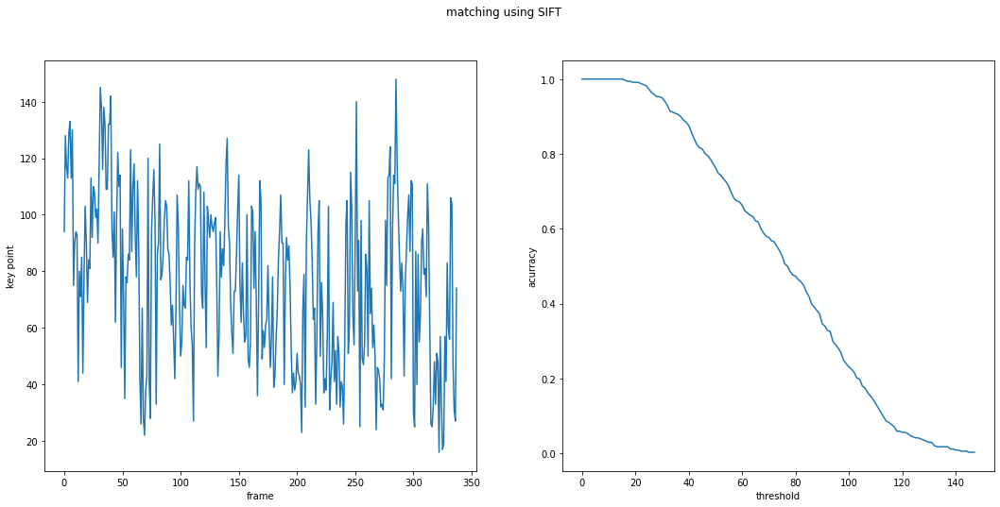

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import time
import cv2 as cv
from matplotlib import pyplot as plt
begin=time.time()
cap= cv.VideoCapture('IMG_2276.mp4')
img = cv.imread('chinsu.png') 
nkeypoint=[]
matchingInVideo(cap,img,nkeypoint,True)
print(str(time.time()-begin)+'s')
acurracy=[]
count=0
for i in range(max(nkeypoint)):
  count=0
  for j in nkeypoint:
    if j>i: count+=1
  acurracy.append(count/len(nkeypoint))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
fig.suptitle('matching using SIFT')
ax1.plot(nkeypoint)
ax1.set_xlabel('frame')
ax1.set_ylabel('key point')
ax2.plot(acurracy)
ax2.set_xlabel('threshold')
ax2.set_ylabel('acurracy')

## Xa gần khác nhau

29.93660831451416s


Text(0, 0.5, 'acurracy')

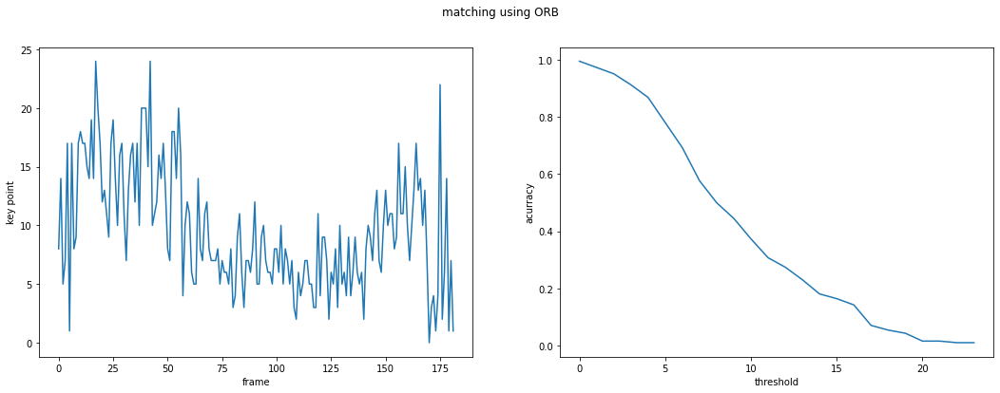

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import time
import cv2 as cv
from matplotlib import pyplot as plt
begin=time.time()
cap= cv.VideoCapture('IMG_2296.mp4')
img = cv.imread('chinsu.png') 
nkeypoint=[]
matchingInVideo(cap,img,nkeypoint,False)
print(str(time.time()-begin)+'s')
acurracy=[]
count=0
for i in range(max(nkeypoint)):
  count=0
  for j in nkeypoint:
    if j>i: count+=1
  acurracy.append(count/len(nkeypoint))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('matching using ORB')
ax1.plot(nkeypoint)
ax1.set_xlabel('frame')
ax1.set_ylabel('key point')
ax2.plot(acurracy)
ax2.set_xlabel('threshold')
ax2.set_ylabel('acurracy')

397.17130613327026s


Text(0, 0.5, 'acurracy')

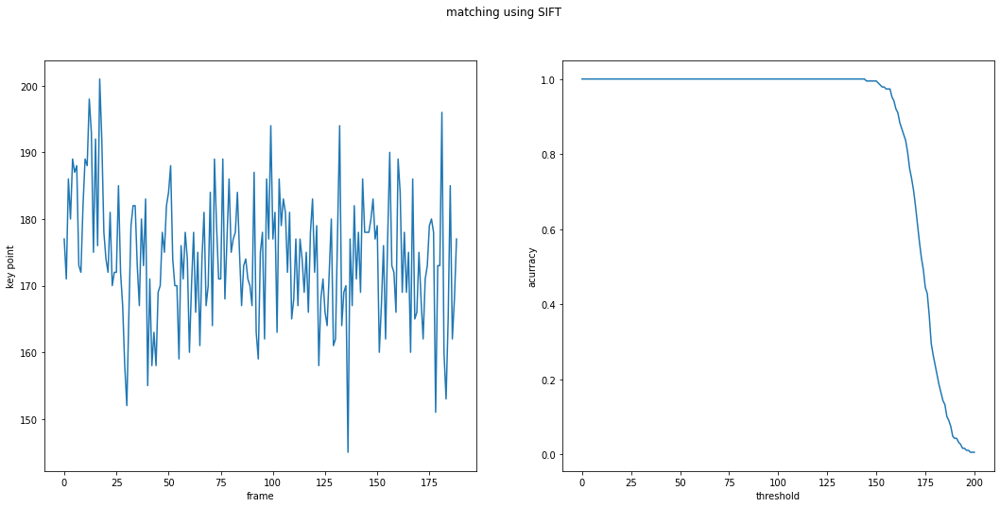

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import time
import cv2 as cv
from matplotlib import pyplot as plt
begin=time.time()
cap= cv.VideoCapture('IMG_2262.mp4')
img = cv.imread('chinsu.png') 
nkeypoint=[]
matchingInVideo(cap,img,nkeypoint,True)
print(str(time.time()-begin)+'s')
acurracy=[]
count=0
for i in range(max(nkeypoint)):
  count=0
  for j in nkeypoint:
    if j>i: count+=1
  acurracy.append(count/len(nkeypoint))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
fig.suptitle('matching using SIFT')
ax1.plot(nkeypoint)
ax1.set_xlabel('frame')
ax1.set_ylabel('key point')
ax2.plot(acurracy)
ax2.set_xlabel('threshold')
ax2.set_ylabel('acurracy')

# Ảnh phức tạp chứa nhiều vật thể

41.58890914916992s


Text(0, 0.5, 'acurracy')

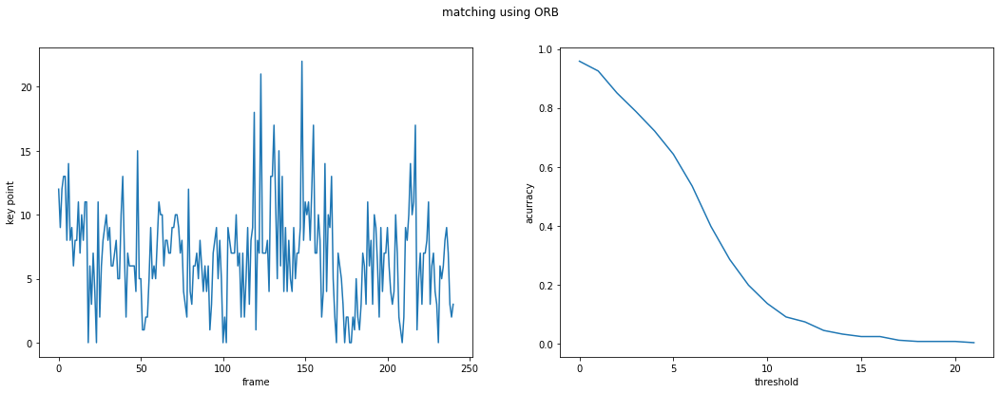

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import time
import cv2 as cv
from matplotlib import pyplot as plt
begin=time.time()
cap= cv.VideoCapture('IMG_2288.mp4')
img = cv.imread('chinsu.png') 
nkeypoint=[]
matchingInVideo(cap,img,nkeypoint,False)
print(str(time.time()-begin)+'s')
acurracy=[]
count=0
for i in range(max(nkeypoint)):
  count=0
  for j in nkeypoint:
    if j>i: count+=1
  acurracy.append(count/len(nkeypoint))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('matching using ORB')
ax1.plot(nkeypoint)
ax1.set_xlabel('frame')
ax1.set_ylabel('key point')
ax2.plot(acurracy)
ax2.set_xlabel('threshold')
ax2.set_ylabel('acurracy')

500.40154576301575s


Text(0, 0.5, 'acurracy')

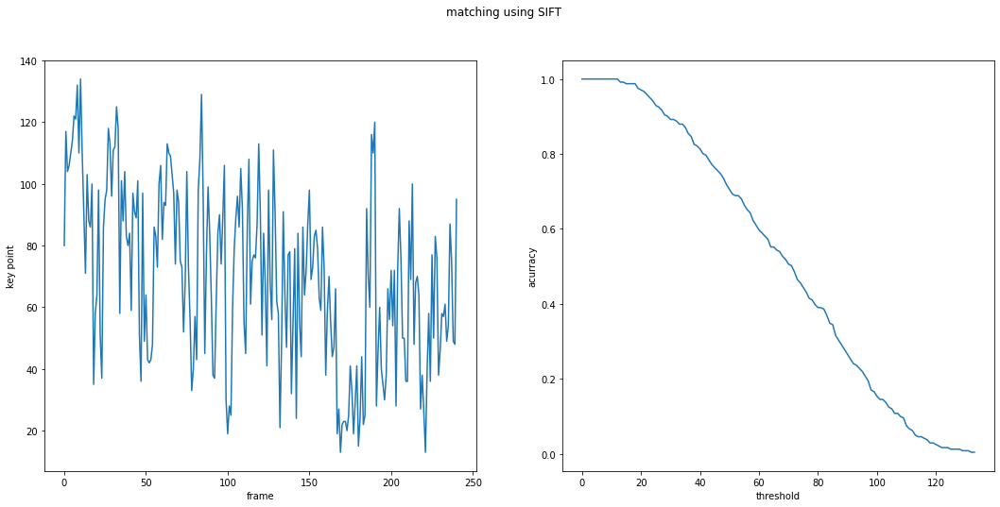

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import time
import cv2 as cv
from matplotlib import pyplot as plt
begin=time.time()
cap= cv.VideoCapture('IMG_2288.mp4')
img = cv.imread('chinsu.png') 
nkeypoint=[]
matchingInVideo(cap,img,nkeypoint,True)
print(str(time.time()-begin)+'s')
acurracy=[]
count=0
for i in range(max(nkeypoint)):
  count=0
  for j in nkeypoint:
    if j>i: count+=1
  acurracy.append(count/len(nkeypoint))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
fig.suptitle('matching using SIFT')
ax1.plot(nkeypoint)
ax1.set_xlabel('frame')
ax1.set_ylabel('key point')
ax2.plot(acurracy)
ax2.set_xlabel('threshold')
ax2.set_ylabel('acurracy')